<a href="https://colab.research.google.com/github/ylacombe/explanatory_notebooks/blob/main/extra_fast_bark_for_long_generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Extra-fast Bark for generating long texts

In this notebook, we'll show you how to generate very long texts very quickly using Bark, Flash Attention 2 and batching.

A few resources before diving into the proper generation:
1. [Interactive introduction to Bark](https://colab.research.google.com/github/ylacombe/notebooks/blob/main/Bark_HuggingFace_Demo.ipynb)
2. [A blog post on optimizing Bark](https://huggingface.co/blog/optimizing-bark)
3. [The 🤗 model card](https://huggingface.co/suno/bark)

## Expected improvements


The following diagram shows the latency for the native attention implementation (no optimisation) against Better Transformer and Flash Attention 2. In all cases, we generate 400 semantic tokens on a 40GB A100 GPU with PyTorch 2.1. Flash Attention 2 is also consistently faster than Better Transformer, and its performance improves even more as batch sizes increase:

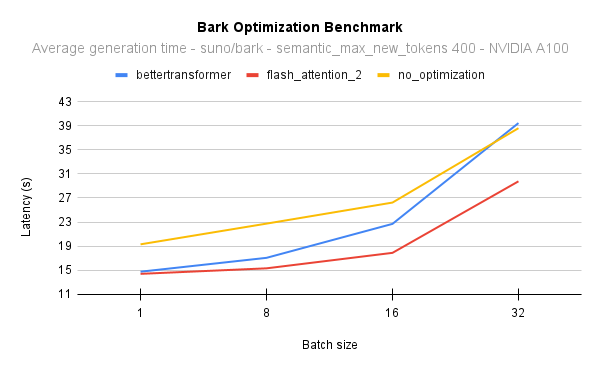



## Requirements


Flash Attention 2 requires recent hardware. You can consult the latest list of compatible hardware in the [official documentation](https://github.com/Dao-AILab/flash-attention#installation-and-features).

If your hardware is not compatible with Flash Attention 2, you can still benefit from attention kernel optimizations thanks to Better Transformer support covered [here](https://huggingface.co/docs/transformers/main/en/model_doc/bark#using-better-transformer).

Here, I'm using Colab Pro, to benefit from the latest GPUs. You can see in the next line that I'm using a 40GB NVIDIA A100.

In [1]:
!nvidia-smi

Fri Nov 10 13:45:21 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P0    43W / 400W |      0MiB / 40960MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Next, we install the 🤗 Transformers package from the main branch, as well as the flash-attn library.

In [2]:
 !pip install --quiet -U flash-attn --no-build-isolation
 !pip install --quiet git+https://github.com/huggingface/transformers.git

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 19.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 34.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 73.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 78.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 35.8 MB/s eta 0:00:00


We also needs `nltk`, which will be used to split text into sentences, and `accelerate` to reduce memory footprint with [CPU offloading](https://huggingface.co/docs/transformers/main/en/model_doc/bark#using-cpu-offload).

In [3]:
 !pip install --quiet nltk accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.4/261.4 kB 4.5 MB/s eta 0:00:00


## Bark Architecture


Bark is a transformer-based text-to-speech model proposed by Suno AI in [suno-ai/bark](https://github.com/suno-ai/bark).

Bark is made of 4 main models:

- `BarkSemanticModel` (also referred to as the 'text' model): a causal auto-regressive transformer model that takes as input tokenized text, and predicts semantic text tokens that capture the meaning of the text.
- `BarkCoarseModel` (also referred to as the 'coarse acoustics' model): a causal autoregressive transformer, that takes as input the results of the `BarkSemanticModel` model. It aims at predicting the first two audio codebooks necessary for EnCodec.
- `BarkFineModel` (the 'fine acoustics' model), this time a non-causal autoencoder transformer, which iteratively predicts the last codebooks based on the sum of the previous codebooks embeddings.
- having predicted all the codebook channels from the `EncodecModel`, Bark uses it to decode the output audio array.

It should be noted that each of the first three modules can support conditional speaker embeddings to condition the output sound according to specific predefined voice.



## Generate an extra long text

### Motivation

Text-to-speech models are very good at generating short sentences. A simple way of generating a longer text is therefore to cut the text into small sentences and run them through the TTS model one by one.
However, you can quickly see the limitations of such a process:
1. it's extremely time-consuming to generate text sentence by sentence. Time quickly adds up.
2. it doesn't make the most of the hardware. Text-to-speech models are generally lightweight and therefore don't fill up your GPUs, especially when generating a single sentence.

### Solution: Batch generation

Batching consists of combining operations for several samples to lower the overall sample generation time compared with sample-by-sample generation.

GPUs are particularly good at batching, as the following code will show.

### Code extract

Let's illustrate batching and Flash Attention 2 with the following text, taken from JFK's famous speech in Berlin.

In [10]:
# JFK Berling Speech extract - 777 ChatGPT tokens

TEXT_TO_GENERATE = """
I am proud to come to this city as the guest of your distinguished Mayor, who has symbolized throughout the world the fighting spirit of West Berlin. And I am proud to visit the Federal Republic with your distinguished Chancellor who for so many years has committed Germany to democracy and freedom and progress, and to come here in the company of my fellow American, General Clay, who has been in this city during its great moments of crisis and will come again if ever needed.

Two thousand years ago the proudest boast was "civis Romanus sum." Today, in the world of freedom, the proudest boast is "Ich bin ein Berliner."

I appreciate my interpreter translating my German!

There are many people in the world who really don't understand, or say they don't, what is the great issue between the free world and the Communist world. Let them come to Berlin. There are some who say that communism is the wave of the future. Let them come to Berlin. And there are some who say in Europe and elsewhere we can work with the Communists. Let them come to Berlin. And there are even a few who say that it is true that communism is an evil system, but it permits us to make economic progress. Lass' sie nach Berlin kommen. Let them come to Berlin.

Freedom has many difficulties and democracy is not perfect, but we have never had to put a wall up to keep our people in, to prevent them from leaving us. I want to say, on behalf of my countrymen, who live many miles away on the other side of the Atlantic, who are far distant from you, that they take the greatest pride that they have been able to share with you, even from a distance, the story of the last 18 years. I know of no town, no city, that has been besieged for 18 years that still lives with the vitality and the force, and the hope and the determination of the city of West Berlin. While the wall is the most obvious and vivid demonstration of the failures of the Communist system, for all the world to see, we take no satisfaction in it, for it is, as your Mayor has said, an offense not only against history but an offense against humanity, separating families, dividing husbands and wives and brothers and sisters, and dividing a people who wish to be joined together.

What is true of this city is true of Germany--real, lasting peace in Europe can never be assured as long as one German out of four is denied the elementary right of free men, and that is to make a free choice. In 18 years of peace and good faith, this generation of Germans has earned the right to be free, including the right to unite their families and their nation in lasting peace, with good will to all people. You live in a defended island of freedom, but your life is part of the main. So let me ask you as I close, to lift your eyes beyond the dangers of today, to the hopes of tomorrow, beyond the freedom merely of this city of Berlin, or your country of Germany, to the advance of freedom everywhere, beyond the wall to the day of peace with justice, beyond yourselves and ourselves to all mankind.

Freedom is indivisible, and when one man is enslaved, all are not free. When all are free, then we can look forward to that day when this city will be joined as one and this country and this great Continent of Europe in a peaceful and hopeful globe. When that day finally comes, as it will, the people of West Berlin can take sober satisfaction in the fact that they were in the front lines for almost two decades.

All free men, wherever they may live, are citizens of Berlin, and, therefore, as a free man, I take pride in the words "Ich bin ein Berliner."
"""


Then import libraries and prepare `nltk`.

In [5]:
import nltk  # we'll use this to split into sentences
import numpy as np
from transformers import BarkModel, AutoProcessor
import torch
import time
import scipy

nltk.download('punkt')
device = "cuda"


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


Now prepare everything by loading the model, the processor and defining some useful parameters.

In [6]:

# Load model with optimization
# note the flag to use Flash Attention 2:  use_flash_attention_2=True
model = BarkModel.from_pretrained("suno/bark", torch_dtype=torch.float16, use_flash_attention_2=True).to(device)

# We are not memory constraint (40 GBs) so we don't need to enable CPU offload to reduce footprint
# model.enable_cpu_offload()

# loads processor
processor = AutoProcessor.from_pretrained("suno/bark")

# some needed parameters
sampling_rate = model.generation_config.sample_rate
silence = np.zeros(int(0.20 * sampling_rate))  # one fifth second of silence
voice_preset = "v2/en_speaker_8"

# warming - to get a fairest estimation of generation time - can be removed
model.generate(**processor("salut").to(device), return_output_lengths=True, min_eos_p=0.3)
model.generate(**processor("salut").to(device), return_output_lengths=True, min_eos_p=0.3)


You are attempting to use Flash Attention 2.0 with a model initialized on CPU. Make sure to move the model to GPU after initializing it on CPU with `model.to('cuda')`.
/usr/local/lib/python3.10/dist-packages/torch/nn/utils/weight_norm.py:30: UserWarning: torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.
  warnings.warn("torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.")


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:10000 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:10000 for open-end generation.


(tensor([[9.5215e-02, 9.4666e-02, 9.4543e-02,  ..., 3.3379e-06, 1.5259e-05,
          2.5988e-05]], device='cuda:0', dtype=torch.float16),
 [24000])

In [11]:
# we use a large batch size
BATCH_SIZE = 32

Now that everything is ready, let's finally generate!

In [15]:
start = time.time()


# split into sentences
model_input = nltk.sent_tokenize(TEXT_TO_GENERATE.replace("\n", " ").strip())

pieces = []
for i in range(0, len(model_input), BATCH_SIZE):
    # take the current batch
    inputs = model_input[i:min(i + BATCH_SIZE, len(model_input))]

    if len(inputs) != 0:
        # tokenize input sentences
        inputs = processor(inputs, voice_preset=voice_preset)

        # generate with bark
        speech_output, output_lengths = model.generate(**inputs.to(device), return_output_lengths=True, min_eos_p=0.5)

        # postprocess each sample to get the right length
        speech_output = [output[:length].cpu().numpy() for (output,length) in zip(speech_output, output_lengths)]

        print(f"{i}-th part generated - {len(inputs)}")

        # you could already play `speech_output` or wait for the whole generation
        pieces += [*speech_output, silence.copy()]

end = time.time()
print("TIME", end - start)
whole_output = np.concatenate(pieces)

# save in wav file
scipy.io.wavfile.write("jfk_speech.wav", rate=sampling_rate, data=whole_output)

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:10000 for open-end generation.


0-th part generated - 3
TIME 52.40761590003967


**It only took around 50 seconds to generate a 4 minutes-ish long audio !!**

To give you a comparison, it took me 150 seconds to generate the same speech with Better Transformer!


Now listen to the audio if you want!

In [16]:
from IPython.display import Audio

Audio(whole_output, rate=sampling_rate)